In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

from scipy.integrate import solve_ivp

from sir_model import *
from helpers import *

Reproduction number R0= 0.9956709956709958
Globally asymptotically stable if beta <=d+nu+mu0. This is False


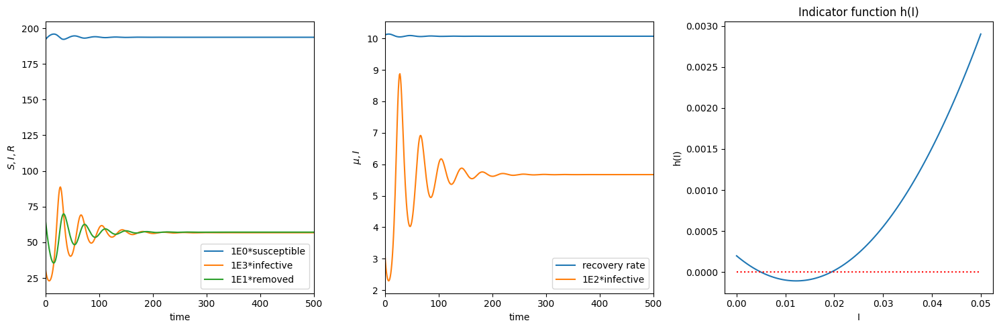

In [5]:
# Define random seed for reproducibility
random_state = 12345

# Define start and end time for simulation
t_0 = 0
t_end = 10000
NT = t_end-t_0

# Set error tolerances for the numerical solution
rtol=1e-8
atol=1e-8

# Define SIR model parameters
beta=11.5  # Rate of contact
A=20       # Rate of media coverage
d=0.1      # Death rate
nu=1       # Immigration rate
b=0.01     # Constant information related coefficient
mu0 = 10   # Minimum recovery rate
mu1 = 10.45  # Maximum recovery rate

# Display model properties
print("Reproduction number R0=", R0(beta, d, nu, mu1))
print('Globally asymptotically stable if beta <=d+nu+mu0. This is', beta <= d+nu+mu0)

# Initialize random number generator
rng = np.random.default_rng(random_state)

# Define initial conditions
SIM0 = rng.uniform(low=(190, 0, 1), high=(199,0.1,8), size=(3,))

# Generate time points for solution
time = np.linspace(t_0,t_end,NT)

# Solve SIR model over defined time span
sol = solve_ivp(model, t_span=[time[0],time[-1]], y0=SIM0, t_eval=time, args=(mu0, mu1, beta, A, d, nu, b), method='LSODA', rtol=rtol, atol=atol)

# Plot results
fig,ax = plt.subplots(1,3,figsize=(15,5))
ax[0].plot(sol.t, sol.y[0]-0*sol.y[0][0], label='1E0*susceptible');
ax[0].plot(sol.t, 1e3*sol.y[1]-0*sol.y[1][0], label='1E3*infective');
ax[0].plot(sol.t, 1e1*sol.y[2]-0*sol.y[2][0], label='1E1*removed');
ax[0].set_xlim([0, 500])
ax[0].legend();
ax[0].set_xlabel("time")
ax[0].set_ylabel(r"$S,I,R$")

ax[1].plot(sol.t, mu(b, sol.y[1], mu0, mu1), label='recovery rate')
ax[1].plot(sol.t, 1e2*sol.y[1], label='1E2*infective');
ax[1].set_xlim([0, 500])
ax[1].legend();
ax[1].set_xlabel("time")
ax[1].set_ylabel(r"$\mu,I$")

I_h = np.linspace(-0.,0.05,100)
ax[2].plot(I_h, h(I_h, mu0, mu1, beta, A, d, nu, b));
ax[2].plot(I_h, 0*I_h, 'r:')
ax[2].set_title("Indicator function h(I)")
ax[2].set_xlabel("I")
ax[2].set_ylabel("h(I)")

fig.tight_layout()


In [6]:
b = 0.022
t_0 = 0
t_end = 1000000
NT = t_end-t_0

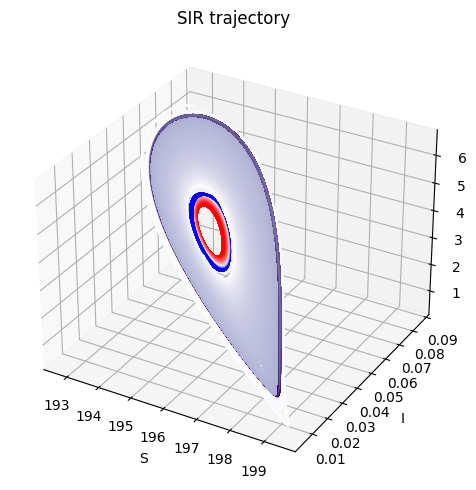

In [7]:
fig=plt.figure(figsize=(5,5))
ax=fig.add_subplot(111,projection="3d")
time = np.linspace(t_0,15000,NT)

cmap = ["BuPu", "Purples", "bwr"][1]

SIM0 = [195.3, 0.052, 4.4] # what happens with this initial condition when b=0.022? -- it progresses VERY slowly. Needs t_end to be super large.
sol = solve_ivp(model, t_span=[time[0],time[-1]], y0=SIM0, t_eval=time, args=(mu0, mu1, beta, A, d, nu, b), method='DOP853', rtol=rtol, atol=atol)
ax.plot(sol.y[0], sol.y[1], sol.y[2], 'r-');
ax.scatter(sol.y[0], sol.y[1], sol.y[2], s=1, c=time, cmap='bwr');

SIM0 = [195.7, 0.03, 3.92] # what happens with this initial condition when b=0.022?
sol = solve_ivp(model, t_span=[time[0],time[-1]], y0=SIM0, t_eval=time, args=(mu0, mu1, beta, A, d, nu, b), method='DOP853', rtol=rtol, atol=atol)
ax.scatter(sol.y[0], sol.y[1], sol.y[2], s=1, c=time, cmap=cmap);

SIM0 = [193, 0.08, 6.21] # what happens with this initial condition when b=0.022?
sol = solve_ivp(model, t_span=[time[0],time[-1]], y0=SIM0, t_eval=time, args=(mu0, mu1, beta, A, d, nu, b), method='DOP853', rtol=rtol, atol=atol)
ax.scatter(sol.y[0], sol.y[1], sol.y[2], s=1, c=time, cmap=cmap);

ax.set_xlabel("S")
ax.set_ylabel("I")
ax.set_zlabel("R")

ax.set_title("SIR trajectory") 
fig.tight_layout()

In [8]:
b_values = np.arange(0.01, 0.031, 0.001)
t_0 = 0
t_end = 10000
NT = t_end-t_0

time = np.linspace(t_0,15000,NT)
cmap = ["BuPu", "Purples", "bwr"][2]

## Task 5.3
### Plottin all combinations of b values for every point.
It is important to note that we have plotted them in 2 different ways

For every b value, there is one plot containing representations for all 3 points at once.

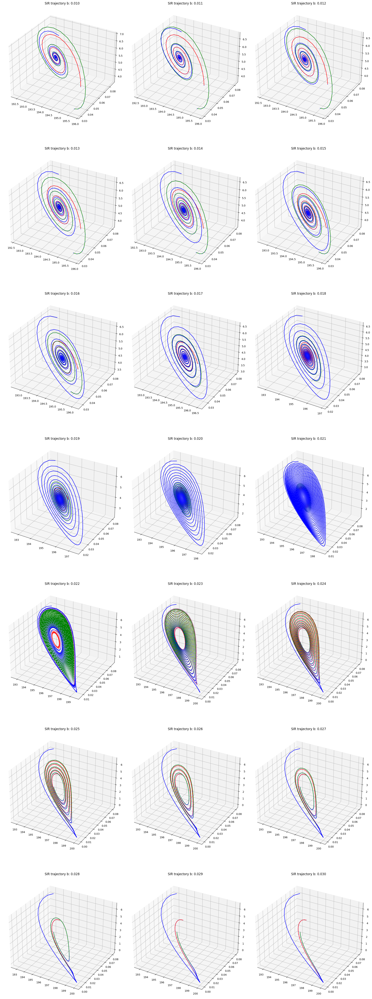

In [9]:
initial_conds = [[195.3, 0.052, 4.4], [195.7, 0.03, 3.92], [193, 0.08, 6.21]]
colors = ['r', 'g', 'b']

fig = plot_for_b_values(model, initial_conds, time, (mu0, mu1, beta, A, d, nu, b), b_values, colors, cmap)


## For every b value, and for every point there is a separate plot containing representations points.

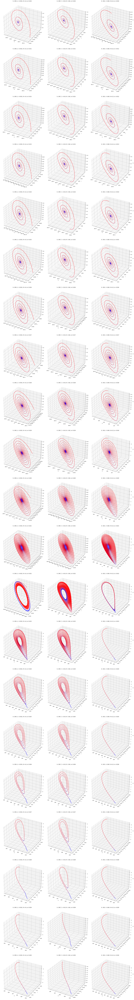

In [118]:
sim_points = [
    [195.3, 0.052, 4.4], 
    [195.7, 0.03, 3.92], 
    [193, 0.08, 6.21]
]

plot_for_sim_points_and_b_values(model, sim_points, time, (mu0, mu1, beta, A, d, nu, b), b_values, cmap='viridis', size=(20, 150))

## Top 9 plots
#### Chosen from the values of b: [0.02, 0.021, 0.022] as it was the most represantive on these plots

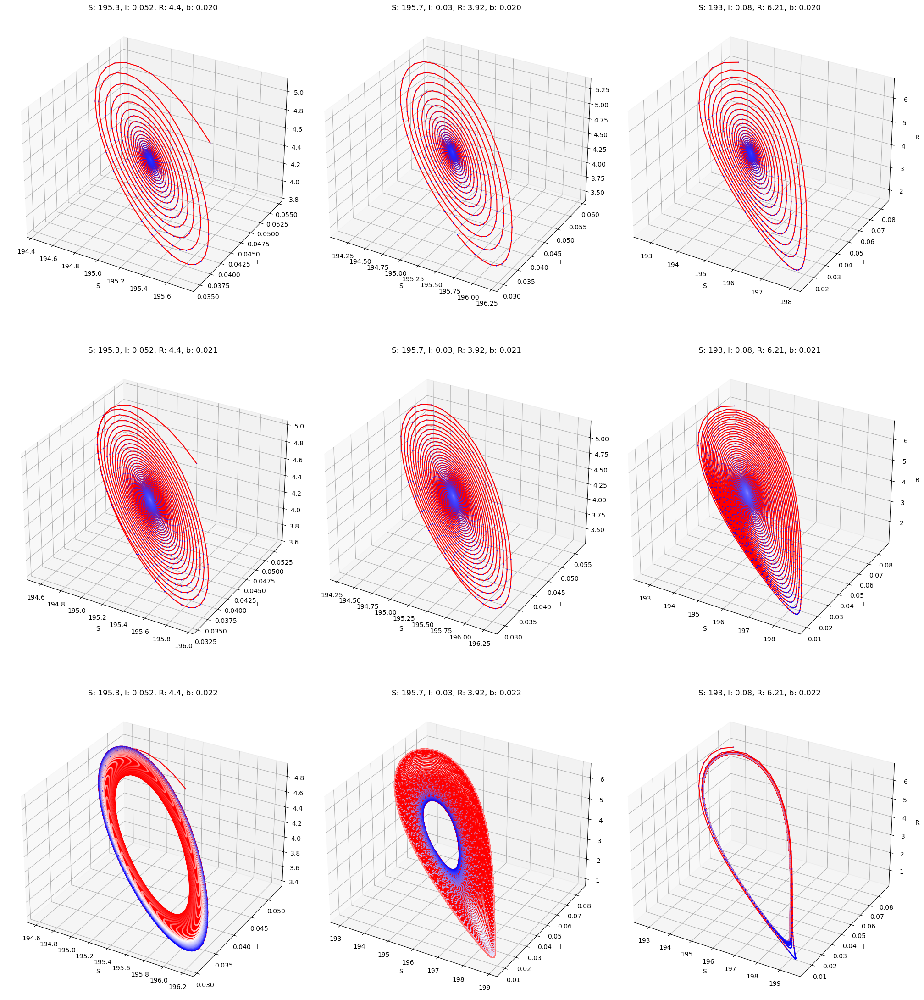

In [126]:
fig = plot_for_sim_points_and_b_values(model, sim_points, time, (mu0, mu1, beta, A, d, nu, b), b_values, cmap='bwr', size=(20, 23), specific_b_values=[0.02, 0.021, 0.022])